# Sript for Understanding Vol and Speed Over Time and Space
Date: 11/08/2019<br/>
Create by: Apoorb

## Load Libraries

In [1]:
%matplotlib inline
import pandas as pd
from pandas import Series
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
from io import BytesIO as StringIO 
import numpy as np
import seaborn as sns
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import datetime
import os
plt.style.use('seaborn-darkgrid')
sns.set(rc={'figure.figsize':(11,4)})
figDir = r'C:\Users\abibeka\Documents\Hive-SDC\FreevalPlots'

## Sensor Info

In [2]:
x1 = pd.ExcelFile(r'C:\Users\abibeka\Documents\Data\SpeedSensor.xlsx')
x1.sheet_names
SensrDat= x1.parse('Sheet1', usecols =['DEVICEID','SITENAME','Sensor_Loc','MP'])
SensrDat.columns = ['DeviceID','Sitename','MP','SensorLoc']
SensrDat = SensrDat[SensrDat.DeviceID.isin([1327, 1342, 396, 3911, 395, 2146, 2319, 1839, 3482, 382])]

In [3]:
SensrDat.set_index('DeviceID',inplace=True)
SensrDict = SensrDat.to_dict('index')

## Vol/ Spd Data—Both Dir

In [4]:
dat = pd.read_csv(r'C:\Users\abibeka\Documents\Data\Feb2018-FreevalVolDat.csv',index_col=0)
dat.columns = [x.split('.')[1] for x in dat.columns]
dat.time5m = pd.to_datetime(dat.time5m)
dat.set_index('time5m',inplace=True)
dat['WeekdayNm'] = dat.index.weekday_name
dat.dtypes
dat.head()

,controller,lane,vehclass,speedmph_avg,nrec,direction,milepost,2015_adt,WeekdayNm
time5m,,,,,,,,,
2018-02-01 00:15:00,382,1,1,58.749999,3,B,401.8,8147,Thursday
2018-02-01 00:15:00,382,1,3,48.120001,4,B,401.8,8147,Thursday
2018-02-01 00:15:00,382,2,1,52.639999,1,B,401.8,8147,Thursday
2018-02-01 00:15:00,382,3,2,61.349998,1,B,401.8,8147,Thursday
2018-02-01 00:15:00,382,3,3,51.160000,1,B,401.8,8147,Thursday


In [5]:
dat.index = dat.index - datetime.timedelta(minutes = 15)

Get daily volume data by sensor 

In [6]:
SensorIDs = [1327, 1342, 396, 3911, 2146, 2319, 1839, 3482, 382]
datDict = {}
for SenId in SensorIDs:
    col_plots = ['nrec']
    dat_sub = dat[dat.controller == SenId]
    dat_daily = dat_sub[col_plots].resample('d').sum()
    dat_daily.loc[:,'controller'] = SenId
    #dat_daily = dat_daily.merge(SensrDat, left_on='controller', right_on='DeviceID')
    datDict[SenId] = dat_daily

In [7]:
fig = go.Figure()
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    fig.add_trace(go.Scatter(x = datDict[SenId].index, y = datDict[SenId].nrec, name=NameSen))
fig.update_layout(xaxis_range = ['2018-02-01','2018-02-28'],title_text = 'Daily Volume (Both Dir Combined)')

## Plot Agg Daily Vol Data EB and WB

In [8]:
dat1 = dat.reset_index().merge(SensrDat,left_on='controller',right_on = 'DeviceID')
dat1.head()

,time5m,controller,lane,vehclass,speedmph_avg,nrec,direction,milepost,2015_adt,WeekdayNm,Sitename,MP,SensorLoc
0,2018-02-01,382,1,1,58.749999,3,B,401.8,8147,Thursday,Pine Bluffs,401.8,WB
1,2018-02-01,382,1,3,48.120001,4,B,401.8,8147,Thursday,Pine Bluffs,401.8,WB
2,2018-02-01,382,2,1,52.639999,1,B,401.8,8147,Thursday,Pine Bluffs,401.8,WB
3,2018-02-01,382,3,2,61.349998,1,B,401.8,8147,Thursday,Pine Bluffs,401.8,WB
4,2018-02-01,382,3,3,51.160000,1,B,401.8,8147,Thursday,Pine Bluffs,401.8,WB


In [9]:
def CorrectDirFun(row):
    out = 'x'
    EBdir = {1: 'EB',2: 'EB',3: 'WB',4: 'WB'}
    WBdir = {1: 'WB',2: 'WB',3: 'EB',4: 'EB'}
    if(row['SensorLoc']=='WB'):
        out = WBdir[row['lane']]
    else: out = EBdir[row['lane']]
    return out

In [10]:
dat1.loc[:,'CorDir'] = dat1.apply(CorrectDirFun,axis=1)

In [11]:
dat1.set_index('time5m',inplace=True)

Group data by time and Travel dir, controller

In [12]:
dat1_dir = dat1.groupby(['controller','CorDir']).resample('D').agg({'nrec':['sum'],'speedmph_avg':['mean']}).droplevel(1,axis=1)
dat1_dir = dat1_dir.reset_index()
dat1_dir.set_index('time5m',inplace=True)
dat1_dir_Hr = dat1.groupby(['controller','CorDir']).resample('H').agg({'nrec':['sum'],'speedmph_avg':['mean']}).droplevel(1,axis=1)
dat1_dir_Hr = dat1_dir_Hr.reset_index()
dat1_dir_Hr.set_index('time5m',inplace=True)

dat1_dir_15Min = dat1.groupby(['controller','CorDir']).resample('15min').agg({'nrec':['sum'],'speedmph_avg':['mean']}).droplevel(1,axis=1)
dat1_dir_15Min = dat1_dir_15Min.reset_index()
dat1_dir_15Min.set_index('time5m',inplace=True)

dat1_dir = dat1.groupby(['controller','CorDir']).resample('D')['nrec'].sum().reset_index()
dat1_dir.set_index('time5m',inplace=True)

dat1_dir_Hr = dat1.groupby(['controller','CorDir']).resample('H')['nrec'].sum().reset_index()
dat1_dir_Hr.set_index('time5m',inplace=True)



In [13]:
SensorIDs = [1327, 1342, 396, 3911, 2146, 2319, 1839, 3482, 382]
dat1Dict_EB = {}
dat1Dict_WB = {}
for SenId in SensorIDs:
    dat1Dict_EB[SenId] = dat1_dir[(dat1_dir.controller == SenId) & (dat1_dir.CorDir=='EB')]
    dat1Dict_WB[SenId] = dat1_dir[(dat1_dir.controller == SenId) & (dat1_dir.CorDir=='WB')]
#dat1Dict_EB[1327]

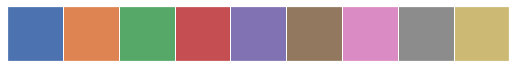

In [14]:
Use_palette = sns.color_palette('deep',9)
Use_palette = Use_palette.as_hex()
sns.palplot(Use_palette)
len(SensorIDs)
Use_palette[8]
ColorDict = {}
for idx, SenId in enumerate(SensorIDs):
    ColorDict[SenId] = Use_palette[idx]

In [15]:
#fig = go.Figure()
fig = make_subplots(rows =2, cols =1, shared_xaxes=True,
subplot_titles=("Daily Volume (EB Dir)","Daily Volume (WB Dir)"))
gr = 0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_EB[SenId].index, y = dat1Dict_EB[SenId].nrec, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                            ,line =dict(color=ColorDict[SenId])), row =1, col=1)
gr =0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_WB[SenId].index, y = dat1Dict_WB[SenId].nrec, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                             ,line =dict(color=ColorDict[SenId])
                             ,showlegend=False), row =2, col=1)
fig.update_layout(plot_bgcolor = 'rgb(220,220,220)', shapes= [
    #1st highlight during Feb 3rd to 4th (1st Sat Sun)
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-03',
    y0 = 0,
    x1 = '2018-02-05',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-10',
    y0 = 0,
    x1 = '2018-02-12',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-17',
    y0 = 0,
    x1 = '2018-02-19',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-24',
    y0 = 0,
    x1 = '2018-02-26',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0)
])
fig.update_yaxes(range = [0, 8000])
fig.show()
plotly.offline.plot(fig,filename = os.path.join(figDir,'DailyVolPlot.html'),auto_open=False)

'C:\\Users\\abibeka\\Documents\\Hive-SDC\\FreevalPlots\\DailyVolPlot.html'

In [16]:
#fig = go.Figure()
fig = make_subplots(rows =2, cols =1, shared_xaxes=True,
subplot_titles=("Daily Avg Speed (EB Dir)","Daily Avg Speed (WB Dir)"))
gr = 0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_EB[SenId].index, y = dat1Dict_EB[SenId].speedmph_avg, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                            ,line =dict(color=ColorDict[SenId])), row =1, col=1)
gr =0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_WB[SenId].index, y = dat1Dict_WB[SenId].speedmph_avg, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                             ,line =dict(color=ColorDict[SenId])
                             ,showlegend=False), row =2, col=1)
fig.update_layout(plot_bgcolor = 'rgb(220,220,220)', shapes= [
    #1st highlight during Feb 3rd to 4th (1st Sat Sun)
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-03',
    y0 = 0,
    x1 = '2018-02-05',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-10',
    y0 = 0,
    x1 = '2018-02-12',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-17',
    y0 = 0,
    x1 = '2018-02-19',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-24',
    y0 = 0,
    x1 = '2018-02-26',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0)
])
fig.update_yaxes(range = [0, 100])
fig.show()
plotly.offline.plot(fig,filename = os.path.join(figDir,'DailySpdPlot.html'),auto_open=False)

'C:\\Users\\abibeka\\Documents\\Hive-SDC\\FreevalPlots\\DailySpdPlot.html'

## Plot Agg Hourly Vol Data EB and WB

In [17]:
#dat1_dir_Hr
SensorIDs = [1327, 1342, 396, 3911, 2146, 2319, 1839, 3482, 382]
dat1Dict_Hr_EB = {}
dat1Dict_Hr_WB = {}
for SenId in SensorIDs:
    dat1Dict_Hr_EB[SenId] = dat1_dir_Hr[(dat1_dir_Hr.controller == SenId) & (dat1_dir_Hr.CorDir=='EB')]
    dat1Dict_Hr_WB[SenId] = dat1_dir_Hr[(dat1_dir_Hr.controller == SenId) & (dat1_dir_Hr.CorDir=='WB')]
#dat1Dict_EB[1327]

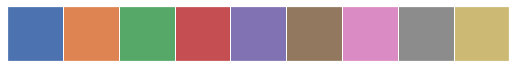

In [18]:
Use_palette = sns.color_palette('deep',9)
Use_palette = Use_palette.as_hex()
sns.palplot(Use_palette)
len(SensorIDs)
Use_palette[8]
ColorDict = {}
for idx, SenId in enumerate(SensorIDs):
    ColorDict[SenId] = Use_palette[idx]

In [19]:
#fig = go.Figure()
fig = make_subplots(rows =2, cols =1, shared_xaxes=True,
subplot_titles=("Hourly Volume (EB Dir)","Hourly Volume (WB Dir)"))
gr = 0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_Hr_EB[SenId].index, y = dat1Dict_Hr_EB[SenId].nrec, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                            ,line =dict(color=ColorDict[SenId])), row =1, col=1)
gr =0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_Hr_WB[SenId].index, y = dat1Dict_Hr_WB[SenId].nrec, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                             ,line =dict(color=ColorDict[SenId])
                             ,showlegend=False), row =2, col=1)
fig.update_layout(plot_bgcolor = 'rgb(220,220,220)', shapes= [
    #1st highlight during Feb 3rd to 4th (1st Sat Sun)
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-03',
    y0 = 0,
    x1 = '2018-02-05',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-10',
    y0 = 0,
    x1 = '2018-02-12',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-17',
    y0 = 0,
    x1 = '2018-02-19',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-24',
    y0 = 0,
    x1 = '2018-02-26',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0)
])
fig.update_yaxes(range = [0, 800])
fig.show()
plotly.offline.plot(fig,filename = os.path.join(figDir,'HourlyVolPlot.html'),auto_open=False)

'C:\\Users\\abibeka\\Documents\\Hive-SDC\\FreevalPlots\\HourlyVolPlot.html'

In [20]:
#fig = go.Figure()
fig = make_subplots(rows =2, cols =1, shared_xaxes=True,
subplot_titles=("Hourly Avg Speed (EB Dir)","Hourly Avg Speed (WB Dir)"))
gr = 0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_Hr_EB[SenId].index, y = dat1Dict_Hr_EB[SenId].speedmph_avg, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                            ,line =dict(color=ColorDict[SenId])), row =1, col=1)
gr =0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_Hr_WB[SenId].index, y = dat1Dict_Hr_WB[SenId].speedmph_avg, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                             ,line =dict(color=ColorDict[SenId])
                             ,showlegend=False), row =2, col=1)
fig.update_layout(plot_bgcolor = 'rgb(220,220,220)', shapes= [
    #1st highlight during Feb 3rd to 4th (1st Sat Sun)
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-03',
    y0 = 0,
    x1 = '2018-02-05',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-10',
    y0 = 0,
    x1 = '2018-02-12',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-17',
    y0 = 0,
    x1 = '2018-02-19',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-24',
    y0 = 0,
    x1 = '2018-02-26',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0)
])
fig.update_yaxes(range = [0, 100])
fig.show()
plotly.offline.plot(fig,filename = os.path.join(figDir,'HourlySpdPlot.html'),auto_open=False)

'C:\\Users\\abibeka\\Documents\\Hive-SDC\\FreevalPlots\\HourlySpdPlot.html'

## Plot Agg 15 Min Vol Data EB and WB 

In [21]:
#dat1_dir_Hr
SensorIDs = [1327, 1342, 396, 3911, 2146, 2319, 1839, 3482, 382]
dat1Dict_15Min_EB = {}
dat1Dict_15Min_WB = {}
for SenId in SensorIDs:
    dat1Dict_15Min_EB[SenId] = dat1_dir_15Min[(dat1_dir_15Min.controller == SenId) & (dat1_dir_15Min.CorDir=='EB')]
    dat1Dict_15Min_WB[SenId] = dat1_dir_15Min[(dat1_dir_15Min.controller == SenId) & (dat1_dir_15Min.CorDir=='WB')]
#dat1Dict_EB[1327]

In [22]:
#fig = go.Figure()
fig = make_subplots(rows =2, cols =1, shared_xaxes=True,
subplot_titles=("15Min Volume (EB Dir)","15Min Volume (WB Dir)"))
gr = 0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_15Min_EB[SenId].index, y = dat1Dict_15Min_EB[SenId].nrec, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                            ,line =dict(color=ColorDict[SenId])), row =1, col=1)
gr =0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_15Min_WB[SenId].index, y = dat1Dict_15Min_WB[SenId].nrec, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                             ,line =dict(color=ColorDict[SenId])
                             ,showlegend=False), row =2, col=1)
fig.update_layout(plot_bgcolor = 'rgb(220,220,220)', shapes= [
    #1st highlight during Feb 3rd to 4th (1st Sat Sun)
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-03',
    y0 = 0,
    x1 = '2018-02-05',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-10',
    y0 = 0,
    x1 = '2018-02-12',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-17',
    y0 = 0,
    x1 = '2018-02-19',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-24',
    y0 = 0,
    x1 = '2018-02-26',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0)
])
fig.update_yaxes(range = [0, 300])
fig.show()
plotly.offline.plot(fig,filename = os.path.join(figDir,'15MinVolPlot.html'),auto_open=False)

'C:\\Users\\abibeka\\Documents\\Hive-SDC\\FreevalPlots\\15MinVolPlot.html'

In [23]:
#fig = go.Figure()
fig = make_subplots(rows =2, cols =1, shared_xaxes=True,
subplot_titles=("15Min Avg Speed (EB Dir)","15Min Avg Speed (WB Dir)"))
gr = 0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_15Min_EB[SenId].index, y = dat1Dict_15Min_EB[SenId].speedmph_avg, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                            ,line =dict(color=ColorDict[SenId])), row =1, col=1)
gr =0
for SenId in SensorIDs:
    NameSen = ', '.join(str(i) for i in list(SensrDict[SenId].values()))
    gr = gr+1
    fig.add_trace(go.Scatter(x = dat1Dict_15Min_WB[SenId].index, y = dat1Dict_15Min_WB[SenId].speedmph_avg, name=NameSen
                             ,legendgroup ='gr{}'.format(gr)
                             ,line =dict(color=ColorDict[SenId])
                             ,showlegend=False), row =2, col=1)
fig.update_layout(plot_bgcolor = 'rgb(220,220,220)', shapes= [
    #1st highlight during Feb 3rd to 4th (1st Sat Sun)
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-03',
    y0 = 0,
    x1 = '2018-02-05',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-10',
    y0 = 0,
    x1 = '2018-02-12',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-17',
    y0 = 0,
    x1 = '2018-02-19',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0),
    
    go.layout.Shape(
    type = 'rect',
    xref='x',
    yref ='paper',
    x0= '2018-02-24',
    y0 = 0,
    x1 = '2018-02-26',
    y1= 1,
    fillcolor = "LightSalmon",
    opacity = 0.5,
    layer = "below",
    line_width = 0)
])
fig.update_yaxes(range = [0, 100])
fig.show()
plotly.offline.plot(fig,filename = os.path.join(figDir,'15MinSpdPlot.html'),auto_open=False)

'C:\\Users\\abibeka\\Documents\\Hive-SDC\\FreevalPlots\\15MinSpdPlot.html'